# Experimenteel: Chebyshev + omgekeerde pantograaf (vaste pivot onder het mechanisme)

Dit notebook verkent een **topologische variant** van het mechanisme uit `01_stagnen_kinematica.ipynb`:
de vaste pantograafpivot is verplaatst van vlak naast de Chebyshev-vierstang naar een punt **ver onder het frame**.

## Topologie

- **Vaste punten**: $A$, $B$ (Chebyshev-frame) en $G$ (nieuwe pantograafpivot, ver onder bij $y = -0.8$ m).
- **Chebyshev-vierstang**: $A\text{-}C\text{-}D\text{-}B$ — identiek aan notebook 01.
- **Coupler-verlenging**: $D\text{-}E$, met $|DE| = \ell_{42}$. Het punt $E$ (vroeger $G$ in nb01) is de bewegende Chebyshev-output.
- **Pantograaf**: rigide rocker $G\text{-}F\text{-}H$ (vast anker $G$), parallelogram $E\text{-}F\text{-}H\text{-}I$.
- **Uitgang**: $I\text{-}End$, verlengde in de richting $H \to I$.

## Verschil met notebook 01

| | Notebook 01 | Dit notebook |
|---|---|---|
| Vaste pantograafpivot | $E$ nabij frame | $G$ bij $y = -0.8$ m |
| Bewegende koppelaar | $G$ (Chebyshev-output) | $E$ (Chebyshev-output, zelfde punt) |
| Versterkingsfactor | 4× | 3× |

De pantograafwet geeft: $End = G + (1 + \ell_{52}/\ell_{51}) \cdot (E - G)$,
zodat $End$ een **3× vergroting** is van $E$'s baan, gezien vanuit het vaste punt $G$.

In [1]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from scipy.optimize import fsolve
from IPython.display import HTML

matplotlib.rcParams["animation.embed_limit"] = 100

def rotate_vector(z, theta):
    R = np.array([[np.cos(theta), -np.sin(theta)],
                  [np.sin(theta),  np.cos(theta)]])
    return R @ np.asarray(z, dtype=float)

def angle_of(vec):
    return np.arctan2(vec[1], vec[0])

## Parameters

**Chebyshev-deel** — ongewijzigd t.o.v. notebook 01 (SCALE = 4).

**Pantograafdeel** — nieuwe afmetingen passend bij de grotere afstand $|G - E|$:

| symbool | betekenis | waarde |
|---|---|---:|
| $G$ | vaste pantograafpivot | $(0.10,\,-0.80)$ m |
| $\ell_{51}$ | $G\!\to\!F$ (rocker deel 1) | $0.45$ m |
| $\ell_{52}$ | $F\!\to\!H$ (rocker deel 2) | $0.90$ m |
| $r_3$ | $E\!\to\!F = H\!\to\!I$ (parallellogram kort) | $0.25$ m |
| $r_7$ | $I\!\to\!End$ | $r_7 = \ell_{52}\,r_3/\ell_{51} = 0.50$ m |
| versterking | $1 + \ell_{52}/\ell_{51}$ | $3\times$ |

In [2]:
# --- Chebyshev (gelijk aan notebook 01) ---
SCALE = 4.0
r1  = 0.025 * SCALE   # = 0.100 m  A-C crank
r2  = 0.0625 * SCALE  # = 0.250 m  B-D rocker
l41 = 0.0625 * SCALE  # = 0.250 m  C-D
l42 = 0.0625 * SCALE  # = 0.250 m  D-E (vroeger D-G)

# --- Vaste punten ---
x_A, y_A = 0.0,  0.0
x_B, y_B = 0.2,  0.0
x_E_fixed, y_E_fixed = 0.10, -0.80  # nieuwe vaste pivot G (in code: 'x_E, y_E' voor hergebruik)

A  = np.array([x_A, y_A])
B  = np.array([x_B, y_B])
Gf = np.array([x_E_fixed, y_E_fixed])  # Gf = vaste pantograafpivot

# --- Pantograaf ---
l51 = 0.45            # Gf-F
l52 = 0.90            # F-H
r3  = 0.25            # E-F = H-I
r6  = l52             # E-I = F-H
l71 = r3              # H-I
r7  = l52 * r3 / l51  # = 0.50 m  (pantograafwet)
versterking = 1.0 + l52 / l51

link_parameters     = (r1, r2, r3, r6, l41, l42, l51, l52, l71, r7)
geometry_parameters = (x_A, y_A, x_B, y_B, x_E_fixed, y_E_fixed, *link_parameters)

print(f'Vaste punten:  A={A},  B={B},  G_fixed={Gf}')
print(f'Pantograaf:    l51={l51}, l52={l52}, r3={r3}, r7={r7:.4f}')
print(f'Versterkingsfactor: {versterking:.2f}×')

Vaste punten:  A=[0. 0.],  B=[0.2 0. ],  G_fixed=[ 0.1 -0.8]
Pantograaf:    l51=0.45, l52=0.9, r3=0.25, r7=0.5000
Versterkingsfactor: 3.00×


In [3]:
# --- Hulpfuncties ---

def circle_intersections(p0, r0, p1, r1_):
    delta = p1 - p0
    dist  = np.linalg.norm(delta)
    if dist < 1e-12:
        raise ValueError('Concentrische cirkels.')
    if dist > r0 + r1_ + 1e-9 or dist < abs(r0 - r1_) - 1e-9:
        raise ValueError(f'Geen snijding: dist={dist:.4f}, r0={r0:.4f}, r1={r1_:.4f}')
    x     = (dist**2 + r0**2 - r1_**2) / (2.0 * dist)
    h     = np.sqrt(max(r0**2 - x**2, 0.0))
    e_hat = delta / dist
    n_hat = np.array([-e_hat[1], e_hat[0]])
    base  = p0 + x * e_hat
    return base + h * n_hat, base - h * n_hat


def solve_pose_circle(theta1, previous_F=None):
    """Positie-oplossing via cirkelsneden (geometrisch, geen fsolve).
    Vaste pivot = Gf, bewegende koppelaaruitgang = E_new."""
    C = A + r1 * np.array([np.cos(theta1), np.sin(theta1)])

    # D: snijpunt cirkels rond C (l41) en rond B (r2)
    D_opts = circle_intersections(C, l41, B, r2)
    D = min(D_opts, key=lambda p: p[1])   # onderste tak

    # E_new: verlenging coupler voorbij D (vroeger G)
    coupler_dir = (D - C) / np.linalg.norm(D - C)
    E_new = D + l42 * coupler_dir

    # F: snijpunt cirkels rond Gf (l51) en rond E_new (r3)
    F_opts = circle_intersections(Gf, l51, E_new, r3)
    if previous_F is None:
        F = min(F_opts, key=lambda p: p[1])
    else:
        F = min(F_opts, key=lambda p: np.linalg.norm(p - previous_F))

    # H, I via pantograafgeometrie
    gf_f_dir = (F - Gf) / np.linalg.norm(F - Gf)
    H      = F     + l52 * gf_f_dir
    I      = E_new + r6  * gf_f_dir
    ih_dir = (H - I) / np.linalg.norm(H - I)
    End    = I - r7 * ih_dir

    return dict(A=A, B=B, C=C, D=D, Gf=Gf, F=F, E_new=E_new, H=H, I=I, End=End)


def loop_closure_eqs(phi, theta1,
                     x_A, y_A, x_B, y_B, x_E, y_E,
                     r1, r2, r3, r6, l41, l42, l51, l52, l71, r7):
    """Dezelfde drie lussen als notebook 01, maar nu met Gf als vaste pivot.
    x_E, y_E bevatten de coordinaten van Gf."""
    theta2, theta3, theta4, theta5, theta6, theta7 = phi
    # Lus 1: Chebyshev A->C->D->B
    F1 = x_A + r1*np.cos(theta1) + l41*np.cos(theta4) - r2*np.cos(theta2) - x_B
    F2 = y_A + r1*np.sin(theta1) + l41*np.sin(theta4) - r2*np.sin(theta2) - y_B
    # Lus 2: A->C->D->E_new->F->Gf  (Gf = vaste pivot, vroeger E)
    F3 = (x_A + r1*np.cos(theta1) + (l41+l42)*np.cos(theta4)
          + r3*np.cos(theta3) - l51*np.cos(theta5) - x_E)
    F4 = (y_A + r1*np.sin(theta1) + (l41+l42)*np.sin(theta4)
          + r3*np.sin(theta3) - l51*np.sin(theta5) - y_E)
    # Lus 3: parallellogram E_new->F->H->I
    F5 = r3*np.cos(theta3) + l52*np.cos(theta5) + l71*np.cos(theta7) - r6*np.cos(theta6)
    F6 = r3*np.sin(theta3) + l52*np.sin(theta5) + l71*np.sin(theta7) - r6*np.sin(theta6)
    return [F1, F2, F3, F4, F5, F6]


def get_angles(theta1, phi_init, *geom):
    sol, _, ier, msg = fsolve(
        lambda x: loop_closure_eqs(x, theta1, *geom),
        phi_init, full_output=True)
    if ier != 1:
        print(f'  fsolve waarschuwing (theta1={np.rad2deg(theta1):.1f}°): {msg.strip()}')
    return sol


def get_positions(theta1, theta2, theta3, theta4, theta5, theta6, theta7,
                  x_A, y_A, x_B, y_B, x_E, y_E,
                  r1, r2, r3, r6, l41, l42, l51, l52, l71, r7):
    """Geeft 10 punten terug: [A, B, C, D, Gf, F, E_new, H, I, End].
    (index-volgorde gelijk aan notebook 01 voor hergebruik van animatiecode)"""
    A_p  = np.array([x_A, y_A])
    B_p  = np.array([x_B, y_B])
    Gf_p = np.array([x_E, y_E])   # vaste pivot (slot 4, vroeger E)

    C     = A_p  + r1  * np.array([np.cos(theta1), np.sin(theta1)])
    D     = B_p  + r2  * np.array([np.cos(theta2), np.sin(theta2)])
    E_new = A_p  + np.array([r1*np.cos(theta1) + (l41+l42)*np.cos(theta4),
                              r1*np.sin(theta1) + (l41+l42)*np.sin(theta4)])
    F     = E_new + r3  * np.array([np.cos(theta3), np.sin(theta3)])
    H     = F     + l52 * np.array([np.cos(theta5), np.sin(theta5)])
    I     = E_new + r6  * np.array([np.cos(theta6), np.sin(theta6)])
    End   = I     + r7  * np.array([np.cos(theta7), np.sin(theta7)])

    return np.array([A_p, B_p, C, D, Gf_p, F, E_new, H, I, End])

In [4]:
# --- Verificatie afstandsbereik ---
dists = []
for th1 in np.linspace(0, 2*np.pi, 360, endpoint=False):
    C = A + r1 * np.array([np.cos(th1), np.sin(th1)])
    D_opts = circle_intersections(C, l41, B, r2)
    D = min(D_opts, key=lambda p: p[1])
    coupler_dir = (D - C) / np.linalg.norm(D - C)
    E_new = D + l42 * coupler_dir
    dists.append(np.linalg.norm(E_new - Gf))
dists = np.array(dists)
print(f'Afstand Gf–E_new over cyclus: min={dists.min():.4f} m,  max={dists.max():.4f} m')
print(f'Vereist: l51-r3={l51-r3:.4f} < {dists.min():.4f}  en  l51+r3={l51+r3:.4f} > {dists.max():.4f}')
ok = (l51 + r3 > dists.max()) and (abs(l51 - r3) < dists.min())
print('Geometrie geldig:', ok)

Afstand Gf–E_new over cyclus: min=0.3166 m,  max=0.5170 m
Vereist: l51-r3=0.2000 < 0.3166  en  l51+r3=0.7000 > 0.5170
Geometrie geldig: True


Residu sluitingsvergelijkingen: ||F|| = 1.62e-16


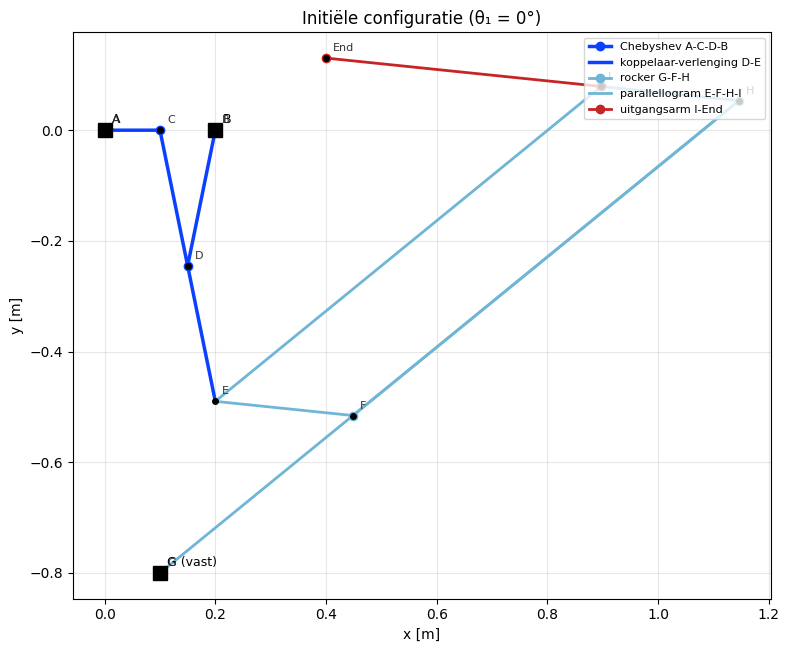

In [5]:
# --- Initiële configuratie (theta1 = 0) ---
theta1_0 = 0.0
pts0 = solve_pose_circle(theta1_0)

phi_init = np.array([
    angle_of(pts0['D']     - B),
    angle_of(pts0['F']     - pts0['E_new']),
    angle_of(pts0['D']     - pts0['C']),
    angle_of(pts0['F']     - Gf),
    angle_of(pts0['I']     - pts0['E_new']),
    angle_of(pts0['I']     - pts0['H']),
])

sol0 = get_angles(theta1_0, phi_init, *geometry_parameters)
res0 = loop_closure_eqs(sol0, theta1_0, *geometry_parameters)
print(f'Residu sluitingsvergelijkingen: ||F|| = {np.linalg.norm(res0):.2e}')

pts_main = get_positions(theta1_0, *sol0, *geometry_parameters)
A_p, B_p, C_p, D_p, Gf_p, F_p, E_p, H_p, I_p, End_p = pts_main

fig, ax = plt.subplots(figsize=(8, 9))
ax.set_aspect('equal'); ax.grid(True, alpha=0.3)
ax.set_xlabel('x [m]'); ax.set_ylabel('y [m]')
ax.set_title('Initiële configuratie (θ₁ = 0°)')

ax.plot([A_p[0],C_p[0],D_p[0],B_p[0]], [A_p[1],C_p[1],D_p[1],B_p[1]], '-o', color='#0b40ff', lw=2.5, label='Chebyshev A-C-D-B')
ax.plot([D_p[0],E_p[0]], [D_p[1],E_p[1]], '-', color='#0b40ff', lw=2.5, label='koppelaar-verlenging D-E')
ax.plot([Gf_p[0],F_p[0],H_p[0]], [Gf_p[1],F_p[1],H_p[1]], '-o', color='#6fb6d6', lw=2.0, label='rocker G-F-H')
ax.plot([E_p[0],F_p[0],H_p[0],I_p[0],E_p[0]], [E_p[1],F_p[1],H_p[1],I_p[1],E_p[1]], '-', color='#6fb6d6', lw=2.0, label='parallellogram E-F-H-I')
ax.plot([I_p[0],End_p[0]], [I_p[1],End_p[1]], '-o', color='#c72525', lw=2.0, label='uitgangsarm I-End')

for fp, nm in zip([A_p, B_p, Gf_p], ['A', 'B', 'G (vast)']):
    ax.plot(fp[0], fp[1], 'ks', ms=10, zorder=5)
    ax.annotate(nm, fp, xytext=(5,5), textcoords='offset points', fontsize=9)

for nm, pt in zip(['A','B','C','D','G','F','E','H','I','End'], pts_main):
    ax.plot(pt[0], pt[1], 'ko', ms=4, zorder=4)
    ax.annotate(nm, pt, xytext=(5,5), textcoords='offset points', fontsize=8, color='#333')

ax.legend(fontsize=8, loc='upper right')
plt.tight_layout(); plt.show()

In [6]:
# --- Volledige simulatie over één cyclus ---
T_cycle  = 5.0
omega1   = 2.0 * np.pi / T_cycle
Ts       = 0.01
t        = np.arange(0.0, T_cycle + Ts/2, Ts)
n_t      = len(t)
theta1_arr = omega1 * t

positions = np.zeros((n_t, 10, 2))

pts_init = solve_pose_circle(theta1_arr[0])
phi_warm = np.array([
    angle_of(pts_init['D']     - B),
    angle_of(pts_init['F']     - pts_init['E_new']),
    angle_of(pts_init['D']     - pts_init['C']),
    angle_of(pts_init['F']     - Gf),
    angle_of(pts_init['I']     - pts_init['E_new']),
    angle_of(pts_init['I']     - pts_init['H']),
])

for k in range(n_t):
    sol = get_angles(theta1_arr[k], phi_warm, *geometry_parameters)
    positions[k] = get_positions(theta1_arr[k], *sol, *geometry_parameters)
    phi_warm = sol

print('Simulatie klaar.')

Simulatie klaar.


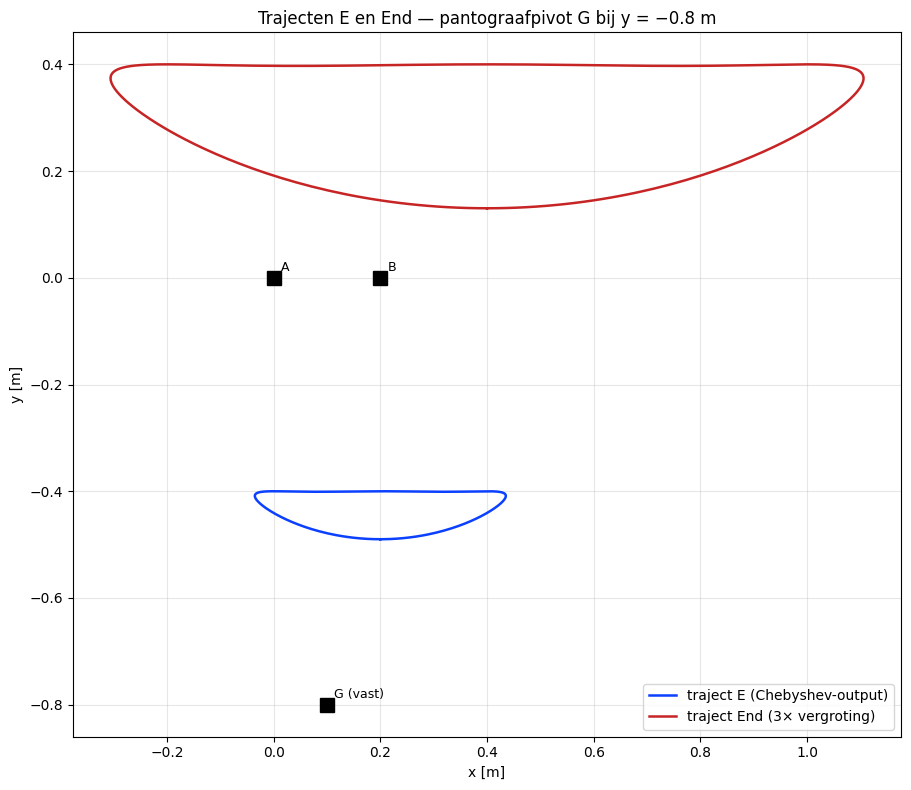

Slag End:  x = 1.4111 m,  y = 0.2697 m
Slag E:    x = 0.4704 m,  y = 0.0899 m
Ratio End/E (x): 3.00   (y): 3.00


In [7]:
# --- Trajecten E (Chebyshev-output) en End ---
E_path   = positions[:, 6, :]   # slot 6 = E_new
End_path = positions[:, 9, :]

fig, ax = plt.subplots(figsize=(10, 8))
ax.plot(E_path[:,0],   E_path[:,1],   color='#0b40ff', lw=1.8, label='traject E (Chebyshev-output)')
ax.plot(End_path[:,0], End_path[:,1], color='#c72525', lw=1.8, label='traject End (3× vergroting)')
ax.plot([x_A, x_B, x_E_fixed], [y_A, y_B, y_E_fixed], 'ks', ms=10, zorder=5)
for nm, x, y in [('A',x_A,y_A), ('B',x_B,y_B), ('G (vast)',x_E_fixed,y_E_fixed)]:
    ax.annotate(nm, (x,y), xytext=(5,5), textcoords='offset points', fontsize=9)
ax.set_aspect('equal'); ax.grid(True, alpha=0.3)
ax.set_xlabel('x [m]'); ax.set_ylabel('y [m]')
ax.set_title('Trajecten E en End — pantograafpivot G bij y = −0.8 m')
ax.legend()
plt.tight_layout(); plt.show()

def stroke(arr, axis):
    return arr[:, axis].max() - arr[:, axis].min()

print('Slag End:  x =', round(stroke(End_path, 0), 4), 'm,  y =', round(stroke(End_path, 1), 4), 'm')
print('Slag E:    x =', round(stroke(E_path,   0), 4), 'm,  y =', round(stroke(E_path,   1), 4), 'm')
print(f'Ratio End/E (x): {stroke(End_path,0)/stroke(E_path,0):.2f}   (y): {stroke(End_path,1)/stroke(E_path,1):.2f}')

In [8]:
# --- Animatie ---
fig, ax = plt.subplots(figsize=(9, 9))
all_pts = positions.reshape(-1, 2)
pad = 0.08
ax.set_xlim(all_pts[:,0].min()-pad, all_pts[:,0].max()+pad)
ax.set_ylim(all_pts[:,1].min()-pad, all_pts[:,1].max()+pad)
ax.set_aspect('equal'); ax.grid(True, alpha=0.3)
ax.set_xlabel('x [m]'); ax.set_ylabel('y [m]')

# Statische trajecten
ax.plot(E_path[:,0],   E_path[:,1],   '--', color='#0b40ff', alpha=0.35, lw=1.0)
ax.plot(End_path[:,0], End_path[:,1], '--', color='#c72525', alpha=0.35, lw=1.0)

cheb_line,  = ax.plot([], [], '-o', color='#0b40ff', lw=2.5, ms=5)
dE_line,    = ax.plot([], [], '-',  color='#0b40ff', lw=2.5)          # D-E
rocker_line,= ax.plot([], [], '-o', color='#6fb6d6', lw=2.0, ms=5)   # G-F-H
para_line,  = ax.plot([], [], '-',  color='#6fb6d6', lw=2.0)          # E-F-H-I-E
out_line,   = ax.plot([], [], '-o', color='#c72525', lw=2.0, ms=5)   # I-End
fixed_pts,  = ax.plot([x_A, x_B, x_E_fixed], [y_A, y_B, y_E_fixed], 'ks', ms=10)
title = ax.set_title('')

def draw(k):
    A_,B_,C_,D_,Gf_,F_,E_,H_,I_,End_ = positions[k]
    cheb_line.set_data( [A_[0],C_[0],D_[0],B_[0]], [A_[1],C_[1],D_[1],B_[1]])
    dE_line.set_data(   [D_[0],E_[0]],              [D_[1],E_[1]])
    rocker_line.set_data([Gf_[0],F_[0],H_[0]],      [Gf_[1],F_[1],H_[1]])
    para_line.set_data( [E_[0],F_[0],H_[0],I_[0],E_[0]], [E_[1],F_[1],H_[1],I_[1],E_[1]])
    out_line.set_data(  [I_[0],End_[0]],             [I_[1],End_[1]])
    title.set_text(f'θ₁ = {np.rad2deg(theta1_arr[k]):.0f}°   t = {t[k]:.2f} s')
    return cheb_line, dE_line, rocker_line, para_line, out_line, title

frame_ids = np.arange(0, n_t, max(1, n_t // 120))
ani = animation.FuncAnimation(fig, draw, frames=frame_ids, interval=50, blit=False)
plt.close(fig)
HTML(ani.to_jshtml())